In [3]:
from pathlib import Path
from PIL import Image
import pillow_heif
import cv2
import numpy as np
import viser
import sys
import time
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split

import torch
import torch.nn as nn
import torch.nn.functional as F
import imageio.v3 as iio

import math


Loading the content

In [9]:
data = np.load(f"./NEW-lego-16.npz")

# Training images: [100, 200, 200, 3]
images_train = data["images_train"] / 255.0

# Cameras for the training images
# (camera-to-world transformation matrix): [100, 4, 4]
c2ws_train = data["c2ws_train"]

# Validation images:
images_val = data["images_val"] / 255.0

# Cameras for the validation images: [10, 4, 4]
# (camera-to-world transformation matrix): [10, 200, 200, 3]
c2ws_val = data["c2ws_val"]

# Test cameras for novel-view video rendering:
# (camera-to-world transformation matrix): [60, 4, 4]
#c2ws_test = data["c2ws_test"]

# Camera focal length
#focal = data["focal"]  # float

K = data['K']

print(K)

[[254.35295663   0.         130.97524006]
 [  0.         260.01217519 175.63759348]
 [  0.           0.           1.        ]]


Lets save the 0th validation image to get the ground truth

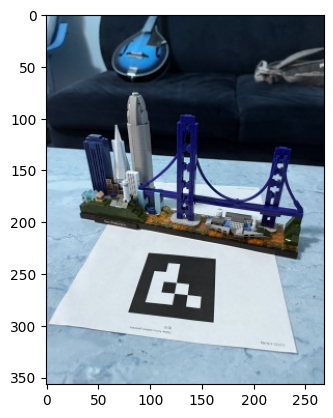

In [14]:
image_val_0 = images_val[0]
plt.imshow(image_val_0)
img_uint8 = (image_val_0[:, :, ::-1] * 255).astype(np.uint8)
filename = f"sf_val_image0.JPG"
iio.imwrite(str(filename), img_uint8)

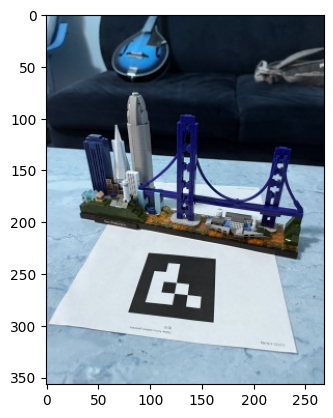

In [11]:
plt.imshow(images_val[0])

# transform function




## naive

In [7]:
def transform(c2w, camera_coords):
    #camera coords expects (4, )
    return c2w @ camera_coords

## vectorized

In [8]:
def transform_vectorized(c2w, camera_coords):
    # c2w expects (..., 4, 4) transformation matrix, where ... denotes arbitrary batch dimensions
    # camera_coords expects (..., N, 4) or (..., 4) where ... denotes arbitrary batch dimensions
    # The batch dimensions of c2w and camera_coords should be broadcastable.
    # The output will have the combined broadcasted batch dimensions and (N, 4) or (4) respectively.
    # Example: If c2w is (B, 4, 4) and camera_coords is (B, N, 4), the output will be (B, N, 4).
    # If c2w is (4, 4) and camera_coords is (N, 4), the output will be (N, 4).
    return camera_coords @ c2w.T

# pixel to camera

## naive

In [9]:
def pixel_to_camera(K, uv, scale):
    k_inv = np.linalg.inv(K)
    camera_coords = scale * (k_inv @ uv)
    camera_coords_h = np.append(camera_coords, 1)
    return camera_coords_h



## vectorized

In [10]:
def pixel_to_camera_vectorized(K, uvs, scale=1):
    # K expects (3, 3) camera intrinsics matrix
    # uvs expects (N, 3) where N is the number of pixel coordinates, and each uv is [u+0.5, v+0.5, 1]
    # scale is a scalar
    k_inv = np.linalg.inv(K)

    # Multiply uvs by k_inv.T to perform k_inv @ uv for each uv in the batch
    camera_coords_3d = scale * (uvs @ k_inv.T) # (N, 3)

    # Append a column of ones to make them homogeneous coordinates (N, 4)
    ones = np.ones((uvs.shape[0], 1))
    camera_coords_h = np.concatenate([camera_coords_3d, ones], axis=-1)

    return camera_coords_h

# pixel to ray

## naive

In [11]:
def pixel_to_ray(K, c2w, uv):
    r_o = c2w[:3, 3] # this is a vec of length 3
    camera_cords = pixel_to_camera(K, uv, 1)
    world_cords = transform(c2w, camera_cords)
    r_d = (world_cords[:3] - r_o)/(np.linalg.norm(world_cords[:3] - r_o))
    return r_o, r_d



## vectorized

In [12]:
def pixel_to_ray_vectorized(K, c2w, uvs):
    # K expects (3, 3) camera intrinsics matrix
    # c2w expects (4, 4) camera-to-world transformation matrix
    # uvs expects (N, 3) where N is the number of pixel coordinates, and each uv is [u+0.5, v+0.5, 1]

    # Ray origins are the camera position, which is the translation component of c2w
    # This origin is the same for all rays from this single camera
    r_o = c2w[:3, 3] # (3,)

    # Convert pixel coordinates to camera coordinates (homogeneous)
    camera_coords_h = pixel_to_camera_vectorized(K, uvs, scale=1) # (N, 4)

    # Transform camera coordinates to world coordinates (homogeneous)
    world_coords_h = transform_vectorized(c2w, camera_coords_h) # (N, 4)

    # Extract 3D world coordinates
    world_coords_3d = world_coords_h[:, :3] # (N, 3)

    # Calculate ray directions
    # Subtract r_o (broadcasted) from each world_coords_3d point
    directions_unnormalized = world_coords_3d - r_o # (N, 3)

    # Normalize the directions
    r_ds = directions_unnormalized / np.linalg.norm(directions_unnormalized, axis=-1, keepdims=True) # (N, 3)

    # r_os should have the same shape as r_ds for consistency when returning multiple rays
    r_os = np.tile(r_o, (uvs.shape[0], 1)) # (N, 3)

    return r_os, r_ds

# sampling rays from images

## naive

In [13]:
def samplingRaysFromImg(img, K, c2w, rays_to_sample):
    H, W = img.shape[:2]
    r_os = []
    r_ds = []
    pixels = []
    for _ in range(rays_to_sample):
        u = np.random.randint(0, W)
        v = np.random.randint(0, H)
        uv = [u+0.5, v+0.5, 1]
        r_o, r_d = pixel_to_ray(K, c2w, uv)
        pixel = img[v, u]

        r_os.append(r_o)
        r_ds.append(r_d)
        pixels.append(pixel)
    return r_os, r_ds, pixels


## vectorized

In [14]:
def samplingRaysFromImg_vectorized(img, K, c2w, rays_to_sample):
    H, W = img.shape[:2]

    # 1. Generate random pixel coordinates
    # Generate 'rays_to_sample' random u coordinates (columns)
    u_coords = np.random.randint(0, W, size=rays_to_sample)
    # Generate 'rays_to_sample' random v coordinates (rows)
    v_coords = np.random.randint(0, H, size=rays_to_sample)

    # 2. Prepare uvs for pixel_to_ray_vectorized: [u+0.5, v+0.5, 1]
    uvs = np.stack([u_coords + 0.5, v_coords + 0.5, np.ones(rays_to_sample)], axis=-1) # (rays_to_sample, 3)

    # 3. Use the vectorized pixel_to_ray function
    r_os, r_ds = pixel_to_ray_vectorized(K, c2w, uvs)

    # 4. Collect corresponding pixel colors
    # img[v_coords, u_coords] directly accesses the colors for the sampled pixels
    pixels = img[v_coords, u_coords] # (rays_to_sample, 3)

    return r_os, r_ds, pixels

# sampling points from rays

## this is super important to change the initaliziation of sample_along_rays near and far!!

In [16]:
def samplingPointsFromRays(r_os, r_ds, near=.02, far=.5, n_samples=64):
    # r_os: (N_rays, 3)
    # r_ds: (N_rays, 3)

    t_edges = np.linspace(near, far, n_samples + 1) # (n_samples + 1,)


        # sample inside each interval
    t = t_edges[:-1] + np.random.rand(n_samples) * (t_edges[1:] - t_edges[:-1]) # (n_samples,)


    # Expand dimensions for broadcasting:
    # r_os becomes (N_rays, 1, 3)
    # r_ds becomes (N_rays, 1, 3)
    # t becomes (1, n_samples, 1)
    r_os_expanded = r_os[:, None, :]
    r_ds_expanded = r_ds[:, None, :]
    t_expanded = t[None, :, None]

    # Perform the operation: (N_rays, 1, 3) + (N_rays, 1, 3) * (1, n_samples, 1)
    # Result: (N_rays, n_samples, 3)
    points = r_os_expanded + r_ds_expanded * t_expanded

    return points

def sample_along_rays(r_os, r_ds, near=.2, far=.5, random=True):
    # This function now simply calls the vectorized samplingPointsFromRays
    return samplingPointsFromRays(r_os, r_ds, near, far)

In [ ]:
# This is a duplicate definition and has been addressed in the previous cell.
# def sample_along_rays(r_os, r_ds, random=True):
#     return np.array([samplingPointsFromRays(ray_0, ray_d) for ray_0, ray_d in zip(r_os, r_ds)])

# Rays data class

In [17]:
class RaysData:
    def __init__(self, images, K, c2ws, index_to_render=0):
        """
        images: (N, H, W, 3) RGB images
        K: (3, 3) camera intrinsics
        c2ws: (N, 4, 4) camera-to-world matrices
        """
        self.images = images
        self.K = K
        self.c2ws = c2ws
        self.H, self.W = images.shape[1:3]
        self.M = len(images)

        #make the pixel grid
        u, v = np.meshgrid(np.arange(self.W), np.arange(self.H))  # shape (H, W)
        uvs_grid = np.stack([u, v], axis=-1)  # shape (H, W, 2)
        self.uvs = uvs_grid.reshape(-1, 2)         # flatten to (H*W, 2)

        #grab the pixel values from the 0th image
        self.pixels = images_train[index_to_render, self.uvs[:,1], self.uvs[:,0]]

        # Prepare uvs for pixel_to_ray_vectorized: [u+0.5, v+0.5, 1]
        uvs_for_rays = np.stack([self.uvs[:, 0] + 0.5, self.uvs[:, 1] + 0.5, np.ones(self.uvs.shape[0])], axis=-1)

        # Use the vectorized pixel_to_ray function
        self.rays_o, self.rays_d = pixel_to_ray_vectorized(self.K, self.c2ws[index_to_render], uvs_for_rays) # (H*W, 3)


    def sampleRays(self, N):
        # N is total number of rays to sample across ALL images

        rays_per_image = N // self.M
        if rays_per_image == 0:
            raise ValueError(f"N ({N}) is too small to sample at least one ray from each of M ({self.M}) images.")

        total_r_os = []
        total_r_ds = []
        total_pixels = []

        # Iterate through all M images
        for idx in range(self.M):
            # Use the vectorized sampling function for each image
            r_os, r_ds, pixels = samplingRaysFromImg_vectorized(self.images[idx], self.K, self.c2ws[idx], rays_per_image)
            total_r_os.append(r_os)
            total_r_ds.append(r_ds)
            total_pixels.append(pixels)

        # Concatenate results from all images
        r_os_batch = np.concatenate(total_r_os, axis=0)  # (M * rays_per_image, 3)
        r_ds_batch = np.concatenate(total_r_ds, axis=0)  # (M * rays_per_image, 3)
        total_pixels = np.concatenate(total_pixels, axis=0) # (M * rays_per_image, 3)

        return r_os_batch, r_ds_batch, total_pixels

# Creating class and assigning width and height

In [18]:
H, W = images_train.shape[1:3]
print(H, W)
"""K = np.array([
        [focal, 0, W/2],
        [0, focal, H/2],
        [0, 0, 1]
    ], dtype=np.float32)"""

dataset = RaysData(images_train, K, c2ws_train)
rays_o, rays_d, pixels = dataset.sampleRays(100)
points = sample_along_rays(rays_o, rays_d)

print(rays_o.shape)

714 536
(80, 3)


In [110]:
server = viser.ViserServer(share=True)
for i, (image, c2w) in enumerate(zip(images_train, c2ws_train)):
    server.add_camera_frustum(
        f"/cameras/{i}",
        fov=2 * np.arctan2(H / 2, K[0, 0]),
        aspect=W / H,
        scale=0.03,
        wxyz=viser.transforms.SO3.from_matrix(c2w[:3, :3]).wxyz,
        position=c2w[:3, 3],
        image=image[:,:,::-1]
    )
for i, (o, d) in enumerate(zip(rays_o, rays_d)):
    server.add_spline_catmull_rom(
        f"/rays/{i}", positions=np.stack((o, o + d * far)),
    )
server.add_point_cloud(
    f"/samples",
    colors=np.zeros_like(points).reshape(-1, 3),
    points=points.reshape(-1, 3),
    point_size=0.005,
)

while True:
    time.sleep(0.1)  # Wait to allow visualization to run

╭────── viser (listening *:8080) ───────╮
│             ╷                         │
│   HTTP      │ http://localhost:8080   │
│   Websocket │ ws://localhost:8080     │
│             ╵                         │
╰───────────────────────────────────────╯

(viser) Share URL requested!

(viser) Generated share URL (expires in 24 hours, max 16 clients): https://seamless-backward.share.viser.studio

/tmp/ipykernel_2996680/282130129.py:3: DeprecationWarning: ViserServer.add_camera_frustum has been deprecated, use ViserServer.scene.add_camera_frustum instead. Alternatively, pin to `viser<0.2.0`.
  server.add_camera_frustum(
/tmp/ipykernel_2996680/282130129.py:13: DeprecationWarning: ViserServer.add_spline_catmull_rom has been deprecated, use ViserServer.scene.add_spline_catmull_rom instead. Alternatively, pin to `viser<0.2.0`.
  server.add_spline_catmull_rom(
/tmp/ipykernel_2996680/282130129.py:16: DeprecationWarning: ViserServer.add_point_cloud has been deprecated, use ViserServer.scene.add_point_cloud instead. Alternatively, pin to `viser<0.2.0`.
  server.add_point_cloud(


(viser) Disconnected from share URL

opening handshake failed
Traceback (most recent call last):
  File "/e1/home/magnust/.nerf_proj/lib/python3.12/site-packages/websockets/http11.py", line 138, in parse
    request_line = yield from parse_line(read_line)
                   ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/e1/home/magnust/.nerf_proj/lib/python3.12/site-packages/websockets/http11.py", line 309, in parse_line
    line = yield from read_line(MAX_LINE_LENGTH)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/e1/home/magnust/.nerf_proj/lib/python3.12/site-packages/websockets/streams.py", line 46, in read_line
    raise EOFError(f"stream ends after {p} bytes, before end of line")
EOFError: stream ends after 0 bytes, before end of line

The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "/e1/home/magnust/.nerf_proj/lib/python3.12/site-packages/websockets/server.py", line 545, in parse
    request = yield from Request.parse(
              ^^^^^^^^^^^^^^

KeyboardInterrupt: 

In [ ]:
dataset = RaysData(images_train, K, c2ws_train)

# This will check that your uvs aren't flipped
uvs_start = 0
uvs_end = 40_000
sample_uvs = dataset.uvs[uvs_start:uvs_end] # These are integer coordinates of widths / heights (xy not yx) of all the pixels in an image
# uvs are array of xy coordinates, so we need to index into the 0th image tensor with [0, height, width], so we need to index with uv[:,1] and then uv[:,0]
assert np.all(images_train[0, sample_uvs[:,1], sample_uvs[:,0]] == dataset.pixels[uvs_start:uvs_end])

# # Uncoment this to display random rays from the first image
indices = np.random.randint(low=0, high=40_000, size=100)

# # Uncomment this to display random rays from the top left corner of the image
# indices_x = np.random.randint(low=100, high=200, size=100)
# indices_y = np.random.randint(low=0, high=100, size=100)
# indices = indices_x + (indices_y * 200)

data = {"rays_o": dataset.rays_o[indices], "rays_d": dataset.rays_d[indices]}
points = sample_along_rays(data["rays_o"], data["rays_d"], random=True)
# ---------------------------------------

server = viser.ViserServer(share=True)
for i, (image, c2w) in enumerate(zip(images_train, c2ws_train)):
  server.add_camera_frustum(
    f"/cameras/{i}",
    fov=2 * np.arctan2(H / 2, K[0, 0]),
    aspect=W / H,
    scale=0.15,
    wxyz=viser.transforms.SO3.from_matrix(c2w[:3, :3]).wxyz,
    position=c2w[:3, 3],
    image=image
  )
for i, (o, d) in enumerate(zip(data["rays_o"], data["rays_d"])):
  positions = np.stack((o, o + d * far))
  server.add_spline_catmull_rom(
      f"/rays/{i}", positions=positions,
  )
server.add_point_cloud(
    f"/samples",
    colors=np.zeros_like(points).reshape(-1, 3),
    points=points.reshape(-1, 3),
    point_size=0.03,
)

while True:
    time.sleep(0.1)  # Wait to allow visualization to run

╭────── viser (listening *:8081) ───────╮
│             ╷                         │
│   HTTP      │ http://localhost:8081   │
│   Websocket │ ws://localhost:8081     │
│             ╵                         │
╰───────────────────────────────────────╯

(viser) Share URL requested!

(viser) Generated share URL (expires in 24 hours, max 16 clients): https://q-noise.share.viser.studio

/tmp/ipykernel_2996680/3071131190.py:24: DeprecationWarning: ViserServer.add_camera_frustum has been deprecated, use ViserServer.scene.add_camera_frustum instead. Alternatively, pin to `viser<0.2.0`.
  server.add_camera_frustum(
/tmp/ipykernel_2996680/3071131190.py:35: DeprecationWarning: ViserServer.add_spline_catmull_rom has been deprecated, use ViserServer.scene.add_spline_catmull_rom instead. Alternatively, pin to `viser<0.2.0`.
  server.add_spline_catmull_rom(
/tmp/ipykernel_2996680/3071131190.py:38: DeprecationWarning: ViserServer.add_point_cloud has been deprecated, use ViserServer.scene.add_point_cloud instead. Alternatively, pin to `viser<0.2.0`.
  server.add_point_cloud(


(viser) Disconnected from share URL

KeyboardInterrupt: 

opening handshake failed
Traceback (most recent call last):
  File "/e1/home/magnust/.nerf_proj/lib/python3.12/site-packages/websockets/http11.py", line 138, in parse
    request_line = yield from parse_line(read_line)
                   ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/e1/home/magnust/.nerf_proj/lib/python3.12/site-packages/websockets/http11.py", line 309, in parse_line
    line = yield from read_line(MAX_LINE_LENGTH)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/e1/home/magnust/.nerf_proj/lib/python3.12/site-packages/websockets/streams.py", line 46, in read_line
    raise EOFError(f"stream ends after {p} bytes, before end of line")
EOFError: stream ends after 0 bytes, before end of line

The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "/e1/home/magnust/.nerf_proj/lib/python3.12/site-packages/websockets/server.py", line 545, in parse
    request = yield from Request.parse(
              ^^^^^^^^^^^^^^

opening handshake failed
Traceback (most recent call last):
  File "/e1/home/magnust/.nerf_proj/lib/python3.12/site-packages/websockets/http11.py", line 138, in parse
    request_line = yield from parse_line(read_line)
                   ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/e1/home/magnust/.nerf_proj/lib/python3.12/site-packages/websockets/http11.py", line 309, in parse_line
    line = yield from read_line(MAX_LINE_LENGTH)
           ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
  File "/e1/home/magnust/.nerf_proj/lib/python3.12/site-packages/websockets/streams.py", line 46, in read_line
    raise EOFError(f"stream ends after {p} bytes, before end of line")
EOFError: stream ends after 0 bytes, before end of line

The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "/e1/home/magnust/.nerf_proj/lib/python3.12/site-packages/websockets/server.py", line 545, in parse
    request = yield from Request.parse(
              ^^^^^^^^^^^^^^

# Part 2.4 Batching and Positional Encoding

In [19]:
def positional_encode_3d(x_y_zs, L=10):
    # x_y_zs: (N_rays, N_samples, 3)
    N_rays, N_samples, _ = x_y_zs.shape
    points = x_y_zs.reshape(-1, 3)  # (N_rays*N_samples, 3)


    # frequency bands
    freq_bands = (2.0 ** np.arange(L)) * math.pi  # (L,)

    # expand dimensions for broadcasting: (N_pts, 3, 1) * (L,) -> (N_pts, 3, L)
    scaled = points[:, :, np.newaxis] * freq_bands[np.newaxis, np.newaxis, :]

    # sin and cos
    sin_enc = np.sin(scaled)  # (N_pts, 3, L)
    cos_enc = np.cos(scaled)  # (N_pts, 3, L)

    # concatenate original points and flattened sin/cos
    pos_enc = np.concatenate(
        [points, sin_enc.reshape(points.shape[0], -1), cos_enc.reshape(points.shape[0], -1)],
        axis=-1
    )
    return pos_enc  # shape: (N_rays*N_samples, 3 + 6*L)

## remember to change the number of pixels sampling

In [20]:
def positional_encode_direction(rays_d, L=4):
    #rays_d is of shape 10,000 x 3

    # frequency bands
    freq_bands = (2.0 ** np.arange(L)) * math.pi  # shape: (L,)

    # expand dimensions for broadcasting: (N, 3, 1) * (L,) -> (N, 3, L)
    scaled = rays_d[:, :, np.newaxis] * freq_bands[np.newaxis, np.newaxis, :]

    # sin and cos
    sin_enc = np.sin(scaled)  # (N, 3, L)
    cos_enc = np.cos(scaled)  # (N, 3, L)

    # concatenate original points and flattened sin/cos
    pos_enc_direction = np.concatenate(
        [rays_d, sin_enc.reshape(rays_d.shape[0], -1), cos_enc.reshape(rays_d.shape[0], -1)],
        axis=-1
    )
    directions_expanded = np.repeat(pos_enc_direction, 64, axis=0)
    return directions_expanded  # shape: (N, 3 + 6*L)

In [22]:
def positional_encode_direction_torch(rays_d, L=4):
    """
    rays_d: (N, 3) tensor of ray directions (should be normalized)
    Returns: (N * 64, 3 + 6L) tensor
    """
    device = rays_d.device
    N = rays_d.shape[0]

    # frequency bands: [π, 2π, 4π, ..., 2^(L-1)π]
    freq_bands = (2.0 ** torch.arange(L, device=device)) * math.pi  # (L,)

    # scale directions: (N, 3, 1) * (L,) -> (N, 3, L)
    scaled = rays_d.unsqueeze(-1) * freq_bands.view(1, 1, L)

    # compute sin and cos
    sin_enc = torch.sin(scaled)
    cos_enc = torch.cos(scaled)

    # concatenate: original + flattened sin/cos
    pos_enc_direction = torch.cat(
        [rays_d, sin_enc.reshape(N, -1), cos_enc.reshape(N, -1)],
        dim=-1
    )

    # repeat for 64 samples per ray
    directions_expanded = pos_enc_direction.repeat_interleave(64, dim=0)
    return directions_expanded  # (N*64, 3 + 6L)


def positional_encode_3d_torch(x_y_zs, L=10):
    """
    x_y_zs: (N_rays, N_samples, 3) tensor of 3D points
    Returns: (N_rays*N_samples, 3 + 6L) tensor
    """
    device = x_y_zs.device
    N_rays, N_samples, _ = x_y_zs.shape

    points = x_y_zs.reshape(-1, 3)  # (N_rays*N_samples, 3)

    freq_bands = (2.0 ** torch.arange(L, device=device)) * math.pi  # (L,)
    scaled = points.unsqueeze(-1) * freq_bands.view(1, 1, L)  # (N_pts, 3, L)

    sin_enc = torch.sin(scaled)
    cos_enc = torch.cos(scaled)

    pos_enc = torch.cat(
        [points, sin_enc.reshape(points.shape[0], -1), cos_enc.reshape(points.shape[0], -1)],
        dim=-1
    )
    return pos_enc  # (N_rays*N_samples, 3 + 6L)

## slow batching

In [23]:
def batch(dataset, size = 500):
    rays_o, rays_d, pixels = dataset.sampleRays(size)
    points = sample_along_rays(rays_o, rays_d)
    return rays_d, pixels, points

In [24]:
rays_d,pixels,more_points = batch(dataset, 10000)
print(pixels.shape)
encoded_points = positional_encode_3d(more_points)
encoded_direction = positional_encode_direction(rays_d)

print(more_points.shape)


(10000, 3)
(10000, 64, 3)


# my model

In [25]:

class NeRFModel(nn.Module):
    def __init__(self, L, D=8):
        super(NeRFModel, self).__init__()
        PE_direction_size = 4 * 6 + 3 #little l = 4
        self.layers = nn.ModuleList(
            [nn.Linear(L * 6 + 3, 256)] + [nn.Linear(256, 256) for _ in range(3)] +
            [nn.Linear(256 + L * 6 + 3, 256)] + [nn.Linear(256, 256) for _ in range(3)]
        )
        self.skip_connection_layer = 4
        self.density = nn.Linear(256, 1)
        self.color_1 = nn.Linear(256, 256)

        self.rgb_1 = nn.Linear(256 + PE_direction_size, 128)
        self.last_rgb = nn.Linear(128, 3)


    def forward(self, x, directions):
        h = x
        for i, layer in enumerate(self.layers):
            if i == self.skip_connection_layer:
                h = torch.cat([x, h], dim=-1)
            h = F.relu(layer(h))
        density = F.relu(self.density(h))
        rgb = self.color_1(h)

        rgb = torch.cat([directions, rgb], dim =-1)

        rgb = F.relu(self.rgb_1(rgb))
        rgb = F.sigmoid(self.last_rgb(rgb))
        return density, rgb




In [26]:
def volrend(sigmas, rgbs, step_size):
    #need to output a torch tensor

    alpha = 1 - torch.exp(-sigmas * step_size)  # [N, L, 1]
    # Transmittance (exclusive cumprod)
    T = torch.cumprod(torch.cat([torch.ones((sigmas.shape[0], 1, 1), device=sigmas.device),
                                 1 - alpha + 1e-10], dim=1), dim=1)[:, :-1, :]
    # Volume rendering
    C = torch.sum(T * alpha * rgbs, dim=1)  # [N, 3]
    return C


In [91]:
import torch
torch.manual_seed(42)
sigmas = torch.rand((10, 64, 1))
rgbs = torch.rand((10, 64, 3))
step_size = (6.0 - 2.0) / 64
rendered_colors = volrend(sigmas, rgbs, step_size)

correct = torch.tensor([
    [0.5006, 0.3728, 0.4728],
    [0.4322, 0.3559, 0.4134],
    [0.4027, 0.4394, 0.4610],
    [0.4514, 0.3829, 0.4196],
    [0.4002, 0.4599, 0.4103],
    [0.4471, 0.4044, 0.4069],
    [0.4285, 0.4072, 0.3777],
    [0.4152, 0.4190, 0.4361],
    [0.4051, 0.3651, 0.3969],
    [0.3253, 0.3587, 0.4215]
  ])
assert torch.allclose(rendered_colors, correct, rtol=1e-4, atol=1e-4)

(64000, 27)


In [27]:
black_images = np.zeros((len(c2ws_val), H, W, 3), dtype=np.float32)
def renderImage(model, device, K, c2ws, index, total_rays, chunk_size, batch_size):
  test_data_novel = RaysData(black_images, K, c2ws, index)

  all_rendered_colors = []

  with torch.no_grad():
      for ray_start in range(0, total_rays, chunk_size):
          ray_end = min(ray_start + chunk_size, total_rays)

          # Get subset of rays (NumPy)
          rays_o_chunk = test_data_novel.rays_o[ray_start:ray_end]
          rays_d_chunk = test_data_novel.rays_d[ray_start:ray_end]

          # Convert NumPy rays to PyTorch tensors and move to device
          rays_o_tensor = torch.from_numpy(rays_o_chunk).float().to(device)
          rays_d_tensor = torch.from_numpy(rays_d_chunk).float().to(device)

          # Sample points along rays (still using NumPy for now)
          test_points = sample_along_rays(rays_o_chunk, rays_d_chunk)

          # Convert sampled points to PyTorch tensors and move to device
          test_points_tensor = torch.from_numpy(test_points).float().to(device)

          # Use PyTorch versions of positional encoding directly on the device
          encoded_test_points = positional_encode_3d_torch(test_points_tensor)
          encoded_test_direction = positional_encode_direction_torch(rays_d_tensor)

          # Process this chunk's points in batches
          all_densities, all_colors = [], []
          for i in range(0, encoded_test_points.shape[0], batch_size):
              d, c = model(encoded_test_points[i:i+batch_size],
                          encoded_test_direction[i:i+batch_size])
              all_densities.append(d)
              all_colors.append(c)

          density = torch.cat(all_densities, dim=0)
          color = torch.cat(all_colors, dim=0)

          # Render this chunk
          density = density.view(ray_end - ray_start, 64, 1)
          color = color.view(ray_end - ray_start, 64, 3)
          rendered_chunk = volrend(density, color, step_size)
          all_rendered_colors.append(rendered_chunk)

  # Combine all chunks
  rendered_colors = torch.cat(all_rendered_colors, dim=0)
  img = rendered_colors.cpu().numpy().reshape(H, W, 3)
  return img

# training time

## make sure this all looks good!

In [34]:
import time
L = 10
loss_fn = nn.MSELoss()

#import the dataset here

num_epochs = 3000
device = torch.device("cuda:0")  # Changed from "mps" to "cuda" for Colab GPUs
model = NeRFModel(L=10).to(device)  # <--- move model parameters to device
optimizer = torch.optim.Adam(model.parameters(), lr=5e-4)
total_rays = H * W
chunk_size = 1024
batch_size = 32768 #this is needed for image rendering
black_images = np.zeros((len(c2ws_val), H, W, 3), dtype=np.float32)
error = {'epoch': [], 'mse': [], 'psnr': [], 'psnr_val': []}
predicted_images = []
near = .2 # CHANGE THESE
far = .5 # CHANGE THESE

##change this so that we're looking in 3d space now

# Corrected: n_samples is 64 from samplingPointsFromRays default
step_size = (far - near) / 64
#rays_d,pixels,more_points = batch(dataset, batchSize)
#print(rays_d.shape)
batchSize = 10000 # Start with a smaller value like 4096 if 10000 is too large for GPU memory
rays_d,pixels,more_points = batch(dataset, batchSize)
#rays_d,pixels,more_points = batch(dataset, batchSize)
#encoded_points = positional_encode_3d(more_points)
#encoded_direction = positional_encode_direction(rays_d)

#print(encoded_direction.shape)

In [35]:
dataset = RaysData(images_train, K, c2ws_train)
valid_dataset = RaysData(images_val, K, c2ws_val)
for n in range(num_epochs):

    #sample n points
    start_batch = time.time()
    rays_d,pixels,more_points = batch(dataset, batchSize)
    end_batch = time.time()

    # Get the actual number of rays sampled in this batch
    actual_num_rays_sampled = rays_d.shape[0]
    #print(pixels.shape)

    #assert rays_d.shape == (batchSize, 3), f"Expected ({batchSize},3), got {rays_d.shape}"
    #assert more_points.shape == (batchSize, 64, 3), f"Expected (B,S=#samples_per_ray,3), got {points.shape}"
    #do positional encoding

    start_encode_points = time.time()
    encoded_points = positional_encode_3d_torch(torch.from_numpy(more_points).float().to(device))
    end_encode_points = time.time()

    start_encode_direction = time.time()
    encoded_direction = positional_encode_direction_torch(torch.from_numpy(rays_d).float().to(device)) # need to convert these to tensor objects
    end_encode_direction = time.time()

    #this is the value we will be backpropping on
    start_to_device_y = time.time()
    y_tensor = torch.from_numpy(pixels).float().to(device)
    end_to_device_y = time.time()

    #put into
    #X_tensor = torch.from_numpy(encoded_points).float().to(device) # encoded_points is already on device
    #direction_tensor = torch.from_numpy(encoded_direction).float().to(device) # encoded_direction is already on device

    start_forward = time.time()
    density, color = model(encoded_points, encoded_direction)
    end_forward = time.time()

    #we need to do some reshaping here
    # Corrected: Reshape to 64 samples per ray using the actual number of rays sampled
    density = density.view(actual_num_rays_sampled, 64, 1)
    color = color.view(actual_num_rays_sampled, 64, 3)

    start_volrend = time.time()
    rendered_colors = volrend(density, color, step_size)
    end_volrend = time.time()


    loss = loss_fn(rendered_colors, y_tensor)
        # Early stopping condition
    """if n == 100:
        psnr = 10 * math.log10(1/loss.item())
        if psnr < 14:
          print(f"Early stopping at epoch {n} due to PSNR ({psnr:.2f}) below 14.")
          break"""
    if n % 200 == 0 or (n == num_epochs - 1):
      psnr = 10 * math.log10(1/loss.item())
      error['epoch'].append(n)
      error['mse'].append(loss.item())
      error['psnr'].append(psnr)
      print(f"step {n}, PSNR: {psnr:.2f}")
      print(f"  Timing: Batch: {end_batch - start_batch:.4f}s, Encode Points: {end_encode_points - start_encode_points:.4f}s, Encode Direction: {end_encode_direction - start_encode_direction:.4f}s, To Device Y: {end_to_device_y - start_to_device_y:.4f}s, Model Forward: {end_forward - start_forward:.4f}s, Volrend: {end_volrend - start_volrend:.4f}s")

      #lets caclulate the psnr on the validation image 0
      with torch.no_grad():
        validation_render = renderImage(model, device, K, c2ws_val, 0, total_rays, chunk_size, batch_size)
        predicted_images.append(validation_render)
        #plt.imshow(validation_render[:, :, ::-1])

        rays_d_val,pixels_val,more_points_val = batch(valid_dataset, batchSize)
        num_rays_sampled_val = rays_d_val.shape[0]
        encoded_points_val = positional_encode_3d_torch(torch.from_numpy(more_points_val).float().to(device))   
        encoded_direction_val = positional_encode_direction_torch(torch.from_numpy(rays_d_val).float().to(device))     
        y_tensor_val = torch.from_numpy(pixels_val).float().to(device)

        density_val, color_val = model(encoded_points_val, encoded_direction_val)
        density_val = density_val.view(num_rays_sampled_val, 64, 1)
        color_val = color_val.view(num_rays_sampled_val, 64, 3)

        rendered_colors_val = volrend(density_val, color_val, step_size)
        mse_val = loss_fn(rendered_colors_val, y_tensor_val)

        psnr_val = 10 * math.log10(1/mse_val.item())
        error['psnr_val'].append(psnr_val)
        print(f"Validation PSNR: {psnr_val}")



    #print(n)
    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

step 0, PSNR: 5.51
  Timing: Batch: 0.0171s, Encode Points: 0.0016s, Encode Direction: 0.0023s, To Device Y: 0.0002s, Model Forward: 0.0005s, Volrend: 0.0002s
Validation PSNR: 5.665287576527956
step 200, PSNR: 14.10
  Timing: Batch: 0.0154s, Encode Points: 0.0664s, Encode Direction: 0.0024s, To Device Y: 0.0002s, Model Forward: 0.0004s, Volrend: 0.0001s
Validation PSNR: 14.187575902584324
step 400, PSNR: 15.58
  Timing: Batch: 0.0162s, Encode Points: 0.0658s, Encode Direction: 0.0024s, To Device Y: 0.0002s, Model Forward: 0.0004s, Volrend: 0.0001s
Validation PSNR: 15.127227046097453
step 600, PSNR: 16.13
  Timing: Batch: 0.0156s, Encode Points: 0.0663s, Encode Direction: 0.0024s, To Device Y: 0.0002s, Model Forward: 0.0004s, Volrend: 0.0001s
Validation PSNR: 15.56598853821171
step 800, PSNR: 16.59
  Timing: Batch: 0.0165s, Encode Points: 0.0656s, Encode Direction: 0.0024s, To Device Y: 0.0002s, Model Forward: 0.0004s, Volrend: 0.0001s
Validation PSNR: 15.952625117767322
step 1000, PSNR

In [56]:
save_model = False
if save_model:
  model_save_path = "./outputs_nerf/sf_10k_3kepochs.pth"
  torch.save(model.state_dict(), model_save_path)
  print(f"Model saved to {model_save_path}")

In [25]:
load_model = False
if load_model:
  device = torch.device("cuda:0")
  model_save_path = "./outputs_nerf/lafufu_10k.pth"

  # Assuming L was 10 when the model was saved. Adjust if you used a different L.
  loaded_model = NeRFModel(L=10)

  # Load the state dictionary onto the device where the model was trained or will be used
  # 'device' variable was previously defined as 'cuda'
  loaded_model.load_state_dict(torch.load(model_save_path, map_location=device))

  # Move the loaded model to the appropriate device
  loaded_model.to(device)

  # Set the model to evaluation mode
  loaded_model.eval()

  print("Model loaded successfully!")
  model = loaded_model

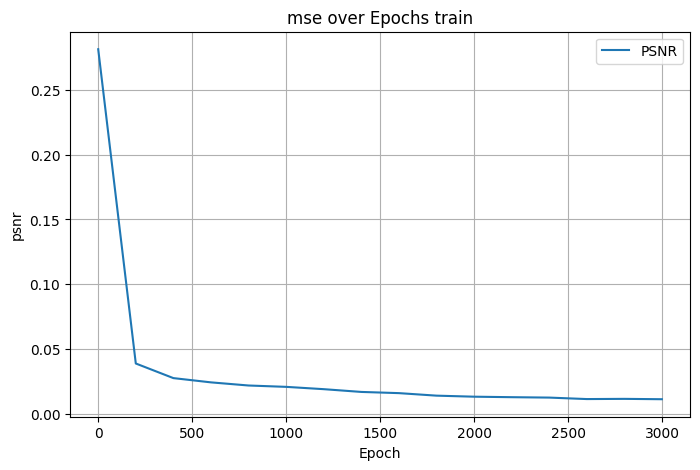

In [ ]:
plt.figure(figsize=(8,5))
plt.plot(error['epoch'], error['mse'], label='PSNR')
plt.xlabel('Epoch')
plt.ylabel('psnr')
plt.title('mse over Epochs train')
plt.grid(True)
plt.legend()
#plt.savefig('./outputs_nerf/sf_10k_3kepochs/mse_train.png')
plt.show()


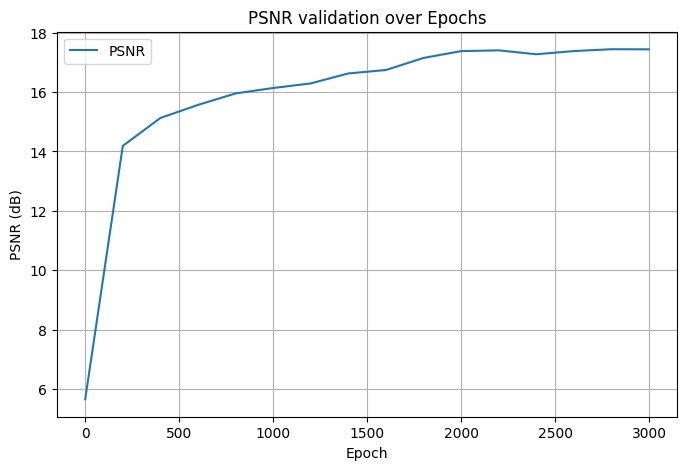

In [37]:
plt.figure(figsize=(8,5))
plt.plot(error['epoch'], error['psnr_val'], label='PSNR')
plt.xlabel('Epoch')
plt.ylabel('PSNR (dB)')
plt.title('PSNR validation over Epochs')
plt.grid(True)
plt.legend()
#plt.savefig('./outputs_nerf/psnr_val_lafufu_small.png') # Save the plot
plt.show()

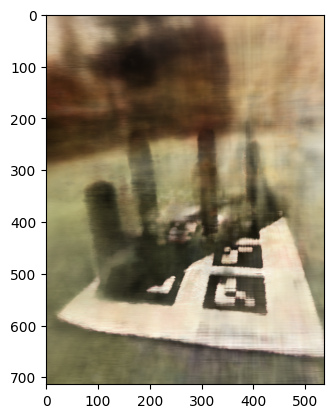

In [42]:

new_image = renderImage(model, device, K, c2ws_train, 1, total_rays, chunk_size, batch_size)[:, :, ::-1]
plt.imshow(new_image)

In [ ]:
#plt.imshow(predicted_images[15][:,:,::-1])

IndexError: list index out of range

In [63]:
import imageio.v3 as iio

output_dir = "./outputs_nerf/sf_10k_3kepochs/renderings"
# Create the directory if it doesn't exist
Path(output_dir).mkdir(parents=True, exist_ok=True)

for i, img_array in enumerate(predicted_images):
    # Convert float (0-1) image to uint8 (0-255)
    img_uint8 = (img_array[:, :, ::-1] * 255).astype(np.uint8)
    filename = Path(output_dir) / f"predicted_image_{i:03d}.png"
    iio.imwrite(str(filename), img_uint8)
    print(f"Saved {filename}")

print(f"All predicted images saved to the '{output_dir}' directory.")

Saved outputs_nerf/sf_10k_3kepochs/renderings/predicted_image_000.png
Saved outputs_nerf/sf_10k_3kepochs/renderings/predicted_image_001.png
Saved outputs_nerf/sf_10k_3kepochs/renderings/predicted_image_002.png
Saved outputs_nerf/sf_10k_3kepochs/renderings/predicted_image_003.png
Saved outputs_nerf/sf_10k_3kepochs/renderings/predicted_image_004.png
Saved outputs_nerf/sf_10k_3kepochs/renderings/predicted_image_005.png
Saved outputs_nerf/sf_10k_3kepochs/renderings/predicted_image_006.png
Saved outputs_nerf/sf_10k_3kepochs/renderings/predicted_image_007.png
Saved outputs_nerf/sf_10k_3kepochs/renderings/predicted_image_008.png
Saved outputs_nerf/sf_10k_3kepochs/renderings/predicted_image_009.png
Saved outputs_nerf/sf_10k_3kepochs/renderings/predicted_image_010.png
Saved outputs_nerf/sf_10k_3kepochs/renderings/predicted_image_011.png
Saved outputs_nerf/sf_10k_3kepochs/renderings/predicted_image_012.png
Saved outputs_nerf/sf_10k_3kepochs/renderings/predicted_image_013.png
Saved outputs_nerf/s

In [43]:
def look_at_origin(pos):
  # Camera looks towards the origin
  forward = -pos / np.linalg.norm(pos)  # Normalize the direction vector

  # Define up vector (assuming y-up)
  up = np.array([0, 0, 1])

  # Compute right vector using cross product
  right = np.cross(up, forward)
  right = right / np.linalg.norm(right)

  # Recompute up vector to ensure orthogonality
  up = np.cross(forward, right)

  # Create the camera-to-world matrix
  c2w = np.eye(4)
  c2w[:3, 0] = right
  c2w[:3, 1] = up
  c2w[:3, 2] = forward
  c2w[:3, 3] = pos

  return c2w
def look_at_origin_fixed_up(pos, up=np.array([0, 0, 1])):
    """
    Camera looks at origin from pos. Keeps the frustum upright using a fixed up vector.
    """
    forward = -pos / np.linalg.norm(pos)  # Direction from camera to origin
    right = np.cross(up, forward)
    right /= np.linalg.norm(right)
    up_corrected = np.cross(forward, right)

    c2w = np.eye(4)
    c2w[:3, 0] = right
    c2w[:3, 1] = up_corrected
    c2w[:3, 2] = forward
    c2w[:3, 3] = pos
    return c2w

def rot_x(phi):
    return np.array([
        [math.cos(phi), -math.sin(phi), 0, 0],
        [math.sin(phi), math.cos(phi), 0, 0],
        [0,0,1,0],
        [0,0,0,1],
    ])
def rotate_position_y(pos, theta):
    R = np.array([
        [ np.cos(theta), -np.sin(theta), 0 ],
        [ np.sin(theta),  np.cos(theta), 0 ],
        [ 0,              0,             1 ]
    ])
    return R @ pos

def rotate_c2w_orientation(c2w, phi):
    # world-space rotation (rotating the camera's rotation matrix)
    R_delta = np.array([
        [ np.cos(phi), -np.sin(phi), 0 ],
        [ np.sin(phi),  np.cos(phi), 0 ],
        [ 0,            0,           1 ]
    ])

    new_c2w = c2w.copy()
    new_c2w[:3, :3] = R_delta @ c2w[:3, :3]  # rotate orientation
    return new_c2w

In [44]:
frames = []

#test_position = c2ws_val[1][:3, 3]
#plt.imshow(renderImage(model, device, K, np.array([c2ws_val[1]]), 0, total_rays, chunk_size, batch_size)[:, :, ::-1])
#print(test_position)

first_c2w = c2ws_train[1] #change this if you want to render novel views

# --- MODIFICATION START ---
# Scale the initial position to move the camera further back
scale_factor = 1
first_c2w[:3, 3] = first_c2w[:3, 3] * scale_factor
# --- MODIFICATION END ---

c2ws_new_test = []

phis = np.linspace(0, 2*np.pi, 40)  # 50 positions around Z-axis
orientation = first_c2w

for phi in phis:
    new_pos = rotate_position_y(orientation[:3, 3], phi)        # rotate around Z
    #new_c2w = rotate_c2w_orientation(orientation, phi)      # keep frustum upright
    #new_c2w[:3, 3] = new_pos
    new_c2w = look_at_origin(new_pos)
    c2ws_new_test.append(new_c2w)

print()

### this is for nerf

In [ ]:
"""frames = []
c2ws_new_test = []
for c2w in c2ws_test:
    c2ws_new_test.append(c2w)"""

Lets visualize this in viser to make sure its working

In [ ]:

server = viser.ViserServer(share=True)

# Make a black placeholder image (e.g., 200×200 RGB)
black_image = np.zeros((10, 10, 3), dtype=np.uint8)

# Iterate over your existing camera poses
for i, c2w in enumerate(c2ws_new_test):

    # Compute a reasonable FOV (e.g., 60°)
    fov = np.deg2rad(60)

    server.scene.add_camera_frustum(
        f"/cameras/{i}",
        fov=fov,
        aspect=1.0,  # square aspect ratio since we aren't showing real images
        scale=0.03,
        wxyz=viser.transforms.SO3.from_matrix(c2w[:3, :3]).wxyz,
        position=c2w[:3, 3],
        image=black_image,   # <-- black placeholder image
    )

print("Added all camera frustums!")

while True:
    time.sleep(0.1)

╭────── viser (listening *:8081) ───────╮
│             ╷                         │
│   HTTP      │ http://localhost:8081   │
│   Websocket │ ws://localhost:8081     │
│             ╵                         │
╰───────────────────────────────────────╯

(viser) Share URL requested!

(viser) Generated share URL (expires in 24 hours, max 16 clients): https://blended-diy.share.viser.studio

Added all camera frustums!


(viser) Connection opened (0, 1 total), 170 persistent messages

(viser) Disconnected from share URL

KeyboardInterrupt: 

We can now create the gif

In [51]:
#Iterate through each c2w matrix in c2ws_test
frames = []
for i, c2w_test in enumerate(c2ws_new_test):
    # Generate view for this camera pose
    # The renderImage function expects c2ws to be an array, and index to select one
    # So we pass a single c2w in an array and index 0
    print(i)
    frame = renderImage(model, device, K, np.array([c2w_test]), 0, total_rays, chunk_size, batch_size)[:, :, ::-1]
    frames.append(frame)

# The frames list now contains all the rendered images for c2ws_test

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39


In [52]:
import imageio.v2 as iio
import numpy as np

# Ensure frames are in the correct format (e.g., uint8)
# The frames are typically float32 from 0-1, so convert to uint8 from 0-255
frames_uint8 = [(frame * 255).astype(np.uint8) for frame in frames]

# Define the output GIF filename with the specified path
gif_filename = './outputs_nerf/sf_10k_train1_nov15.gif'

# Save the frames as a GIF
iio.mimsave(gif_filename, frames_uint8, fps=20) # You can adjust fps as needed

print(f"GIF saved as {gif_filename}")

GIF saved as ./outputs_nerf/sf_10k_train1_nov15.gif


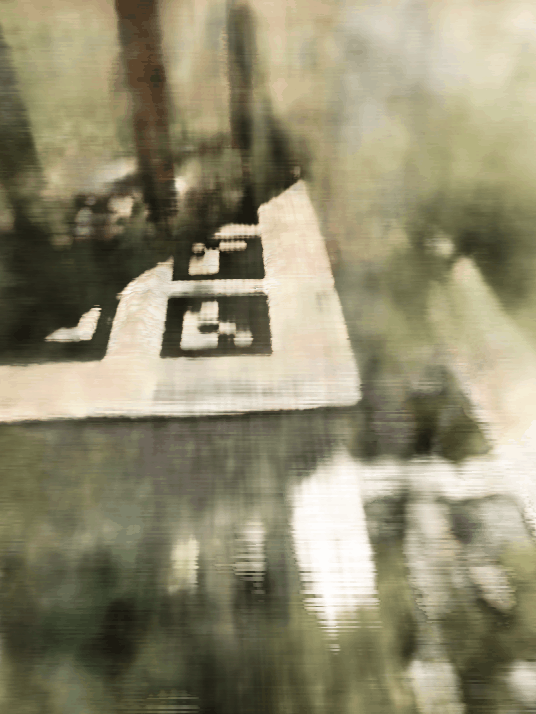

In [54]:
from IPython.display import Image, display
display(Image(filename=gif_filename))

# time to load labubu